# Watermark Removal Project

In [1]:
#load in the required packages
!pip install zip_files
!pip install pytorch-fid
!pip install kaggle
import numpy as np 
import random
import pandas as pd 
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import datasets, transforms, models
from torchvision.utils import save_image
from IPython.display import display
from PIL import Image, ImageFont, ImageDraw, ImageOps
import matplotlib.pyplot as plt
import os
from torch.autograd import Variable
from torch.utils.data import TensorDataset, random_split, DataLoader, RandomSampler, SequentialSampler
import torchvision.transforms.functional as TF
import string
import gc
from IPython.display import FileLink
import subprocess as sp
from google.colab import drive
drive.mount('/content/drive')

#set up GPU
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else "cpu")

  Created wheel for pytorch-fid: filename=pytorch_fid-0.2.1-py3-none-any.whl size=14835 sha256=a5da024f5c3179e4c479d5392b60c277df8b66f4a034276fd9074f200d45a67c
  Stored in directory: /root/.cache/pip/wheels/24/ac/03/c5634775c8a64f702343ef5923278f8d3bb8c651debc4a6890
Successfully built pytorch-fid
Mounted at /content/drive


In [2]:
#upload the Kaggle json to import the data properly (NEED TO UPLOAD YOUR OWN KAGGLE JSON)
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 68 bytes


In [3]:
#read in the dataset
!kaggle datasets download -d felicepollano/watermarked-not-watermarked-images

 99% 694M/698M [00:06<00:00, 159MB/s]
100% 698M/698M [00:07<00:00, 104MB/s]


In [4]:
#upload font and unzip data (upload watermark font)
font = files.upload()
!unzip /content/watermarked-not-watermarked-images.zip

Streaming output truncated to the last 5000 lines.
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3535082.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3535630.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536072.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536235.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536271.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536293.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536426.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3536516.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3539894.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3539898.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3544555.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3546189.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-354941.jpeg  
  inflating: wm-nowm/valid/no-watermark/pexels-photo-3551217.jpeg 

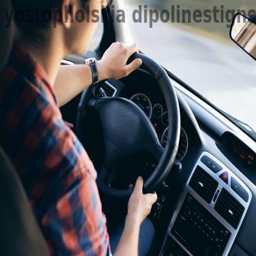

In [5]:
#test out reading in the data
Image.open("/content/wm-nowm/train/watermark/IMG_3496bfree.jpg").resize((256,256))

# Data Processing

In [6]:
#function to create the watermarks on preexisintg photos
prints = list(string.printable)[0:84]

def gen_watermark(im_str, train = 1):
    
    #open all of the images from the dataset as jpegs
    img = Image.open("/content/wm-nowm/train/no-watermark/{}".format(im_str))
    
    #generate random font size between 30-100
    font_size = np.random.randint(low = 20, high = 100)
    
    #create the watermark font for the image
    font = ImageFont.truetype("/content/abel-regular.ttf", font_size) 
    
    #generate image to hold the watermark text object
    img_temp = Image.new('L', (350,350))
    
    #create the watermark text, of random length, using random printable characters
    text_str = np.random.choice(prints, np.random.randint(low=5, high = 10))
    text_str = "".join(text_str)
    
    #draw on temporary image with text
    draw_temp = ImageDraw.Draw(img_temp) 
    
    #generate a random integer for the opacity argument (fill)
    opac = 200 #np.random.randint(low=10, high=15)
    
    #insert text onto the temporary image
    draw_temp.text((0, 0), text_str,  font=font, fill=opac)
    
    #generate a random integer for rotation:
    rot_int = np.random.randint(low = 0, high = 20)
    
    #rotate the text on the temporary image
    rotated_text = img_temp.rotate(rot_int,  expand=1)
    
    #default color of watermark set to white; change if desired
    col_1 = (200,51,53) #(173, 21, 36)
    col_2 = (200,51,53)
    
    #generate a random location for the watermark on the image
    rand_loc = tuple(np.random.randint(low=10,high=100, size = (2,)))
    
    #merge the temporary image with text with the image passed in 
    #third tuple also needs to be random: controls the location of the img
    img.paste(ImageOps.colorize(rotated_text, col_1, col_2), rand_loc,  rotated_text)
    
    #this yeilds a new image with a watermark
    return img

## Train Data

In [8]:
#read in the no-watermark data and generated red watermarks
torch.manual_seed(680)
np.random.seed(680)
random.seed(680)
train_files = set(os.listdir("/content/wm-nowm/train/no-watermark"))
train_files = sorted(train_files)

train_watermark = []
train_no_watermark = []
for ind, file in enumerate(train_files):
    img = gen_watermark(file)
    train_no_watermark.append(Image.open(os.path.join("/content/wm-nowm/train/no-watermark", file)).resize((256,256)).convert('RGB'))
    train_watermark.append(img.resize((256,256)).convert('RGB'))

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [9]:
#clear data
del train_files
gc.collect()

44

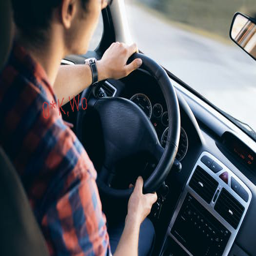

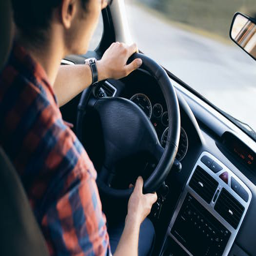

(None, None)

In [10]:
#print check
display(train_watermark[0]), display(train_no_watermark[0])

In [11]:
#define dataset for watermarks and augmentations
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, img_list, target_list):
        super(MyDataset, self).__init__()
        self.img_list = img_list
        self.targets = target_list

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img = self.img_list[idx]
        target = self.targets[idx]
        
        #random horizontal flip
        if random.random() <= 0.2:
            img = TF.hflip(img)
            target = TF.hflip(target)
            
        #random autocontrast
        if random.random() <= 0.2:
            img = TF.autocontrast(img)
            target = TF.autocontrast(target)
        
        #to tensor
        img = TF.to_tensor(img)
        target = TF.to_tensor(target)
        
        #normalize
        normalize = transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
        img = normalize(img)
        target = normalize(target)
        
        return img, target

In [12]:
#create dataset
train_watermark_tensor = [x for x in train_watermark]
train_no_watermark_tensor = [x for x in train_no_watermark]
train_tensor_combined = MyDataset(train_watermark_tensor, train_no_watermark_tensor)

In [13]:
#clear RAM
del train_watermark
del train_no_watermark
gc.collect()

203

In [14]:
#train validation split
train_size = int(0.9 * len(train_tensor_combined))
val_size = len(train_tensor_combined) - train_size
train_dataset, val_dataset = random_split(train_tensor_combined, [train_size, val_size])
print('{:>5,} training samples'.format(train_size))
print('{:>5,} validation samples'.format(val_size))

11,229 training samples
1,248 validation samples


In [15]:
#clear RAM
del train_tensor_combined
gc.collect()

102

In [16]:
#create dataloaders
batch_size = 32

# random sampling for training batching
train_dataloader = DataLoader(
            train_dataset,  # The training samples.
            sampler = RandomSampler(train_dataset), # Select batches randomly
            batch_size = batch_size # Trains with this batch size.
        )

# normal sampling for val batching
validation_dataloader = DataLoader(
            val_dataset, # The validation samples.
            sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )

In [17]:
#clear RAM
del train_dataset
del val_dataset
gc.collect()

100

# Define Pix2Pix GAN Generator

In [18]:
# initialization function

def init_weights(net, init_type='normal', scaling=0.02):
    def init_func(m):  
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and (classname.find('Conv')) != -1:
            torch.nn.init.normal_(m.weight.data, 0.0, scaling)
        elif classname.find('BatchNorm2d') != -1:  
            torch.nn.init.normal_(m.weight.data, 1.0, scaling)
            torch.nn.init.constant_(m.bias.data, 0.0)

    print('initialize network with %s' % init_type)
    net.apply(init_func)  

In [19]:
#generator architecture

class UnetGenerator(nn.Module):
    """Create a Unet-based generator"""

    def __init__(self, input_nc, output_nc, nf=64, norm_layer=nn.BatchNorm2d, use_dropout=False):
        super(UnetGenerator, self).__init__()
        # construct unet structure
        # add the innermost block
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True) 
        #print(unet_block)

        # add intermediate block with nf * 8 filters
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)

        # gradually reduce the number of filters from nf * 8 to nf. 
        unet_block = UnetSkipConnectionBlock(nf * 4, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = UnetSkipConnectionBlock(nf * 2, nf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = UnetSkipConnectionBlock(nf, nf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        
        # add the outermost block
        self.model = UnetSkipConnectionBlock(output_nc, nf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer)  

    def forward(self, input):
        """Standard forward"""
        return self.model(input)

In [20]:
#generator block architecture

class UnetSkipConnectionBlock(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,
                 submodule=None, outermost=False, innermost=False, norm_layer=nn.BatchNorm2d, use_dropout=False):
        super(UnetSkipConnectionBlock, self).__init__()
        self.outermost = outermost
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:   # add skip connections
            return torch.cat([x, self.model(x)], 1)

In [21]:
#discriminator architecture

class Discriminator(nn.Module):
    def __init__(self, input_nc, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        super(Discriminator, self).__init__()
        kw = 4
        padw = 1
        sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):  # gradually increase the number of filters
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=False),
                norm_layer(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=False),
            norm_layer(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw), nn.Sigmoid()]  # output 1 channel prediction map
        self.model = nn.Sequential(*sequence)

    def forward(self, input):
        """Standard forward."""
        return self.model(input)

In [22]:
#losses
adversarial_loss = nn.BCELoss() 
l1_loss = nn.L1Loss()

#generator loss
def generator_loss(generated_image, target_img, G, real_target):
    gen_loss = adversarial_loss(G, real_target)
    l1_l = l1_loss(generated_image, target_img)
    gen_total_loss = gen_loss + (45*l1_l)
    #print(gen_loss)
    return gen_total_loss

#discriminator loss
def discriminator_loss(output, label):
    disc_loss = adversarial_loss(output, label)
    return disc_loss

In [23]:
# #make the output folders
os.makedirs("./targets")
os.makedirs("./generated")

initialize network with normal
initialize network with normal
Epoch 16/100, Discriminator Loss: 0.5671293841903111, Generator Loss: 4.287898799972317


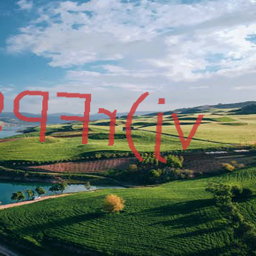

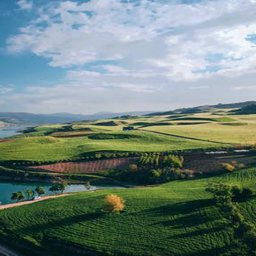

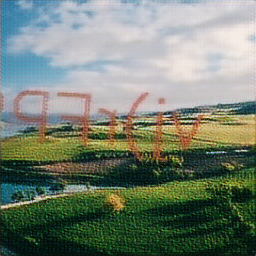

Epoch 17/100, Discriminator Loss: 0.38162335215476034, Generator Loss: 4.471113284428914


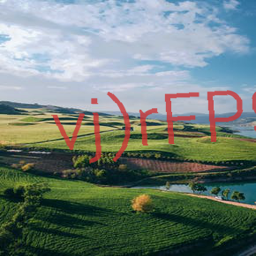

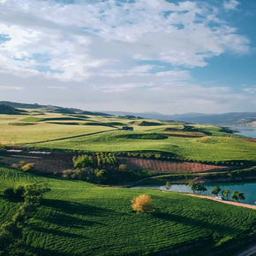

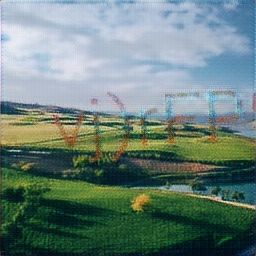

Epoch 18/100, Discriminator Loss: 0.5716521898602955, Generator Loss: 3.0907031419949655


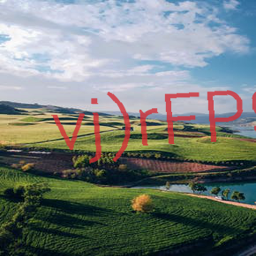

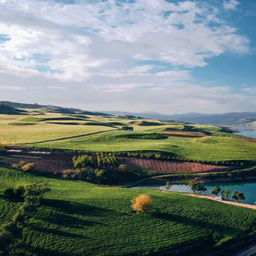

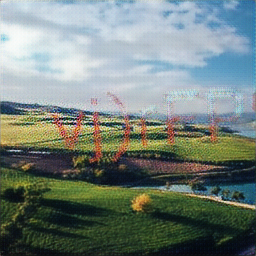

Epoch 19/100, Discriminator Loss: 0.37718259669545817, Generator Loss: 3.9950375546756973


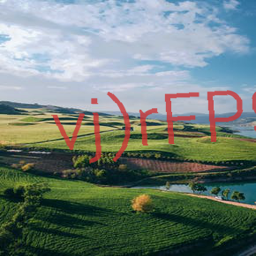

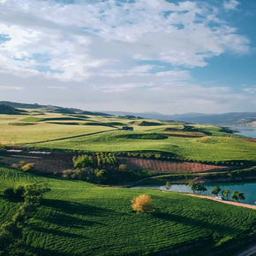

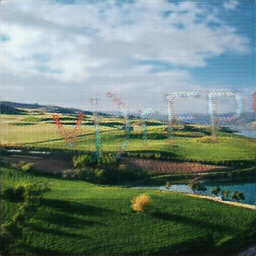

Epoch 20/100, Discriminator Loss: 0.22115329746256432, Generator Loss: 4.966092574630368


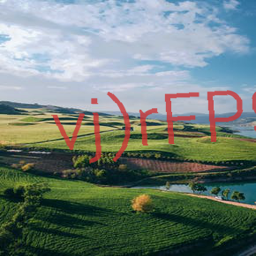

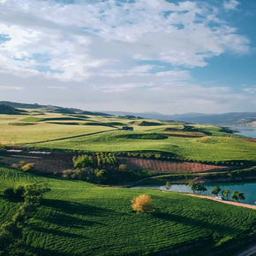

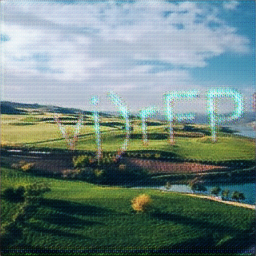

Epoch 21/100, Discriminator Loss: 0.28199493234109485, Generator Loss: 4.846472464056096


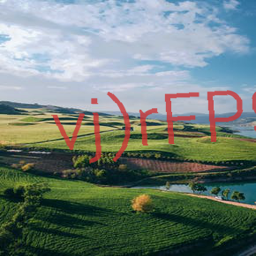

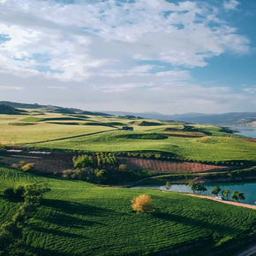

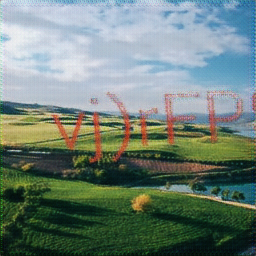

Epoch 22/100, Discriminator Loss: 0.5172037733738652, Generator Loss: 2.935141222769039


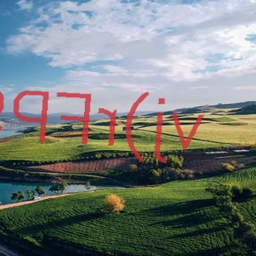

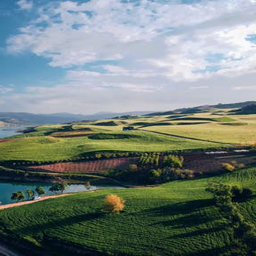

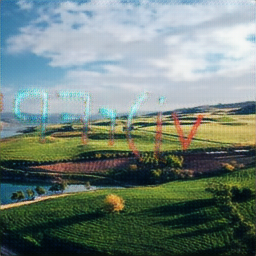

Epoch 23/100, Discriminator Loss: 0.4461386789397955, Generator Loss: 3.3483810384049373


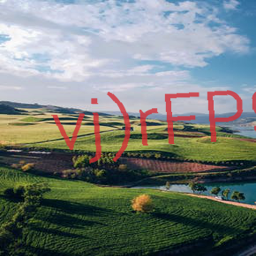

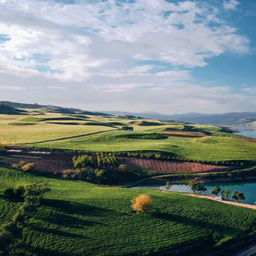

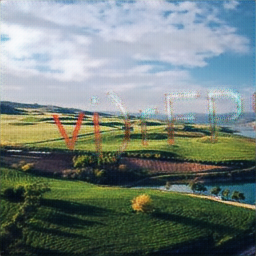

Epoch 24/100, Discriminator Loss: 0.25333955669457203, Generator Loss: 4.608807670085179


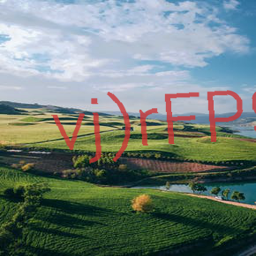

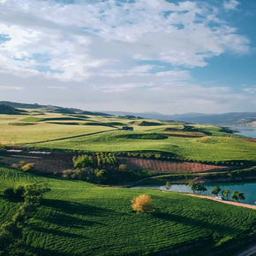

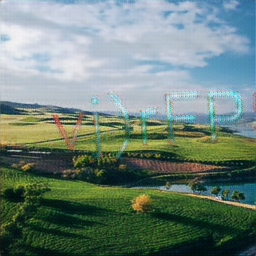

Epoch 25/100, Discriminator Loss: 0.17626695406302795, Generator Loss: 5.3681148171764494


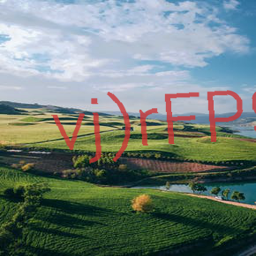

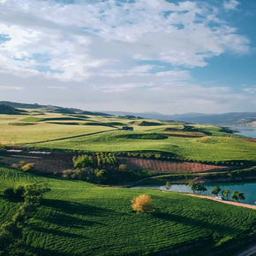

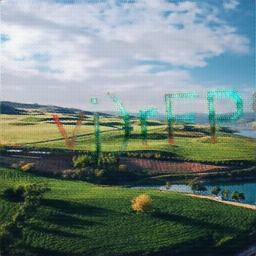

Epoch 26/100, Discriminator Loss: 0.20813420312555422, Generator Loss: 4.962770660039027


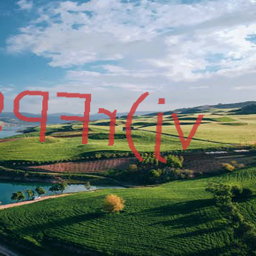

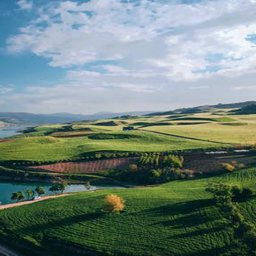

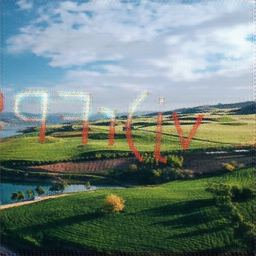

Epoch 27/100, Discriminator Loss: 0.1599082859749428, Generator Loss: 5.411987915337935


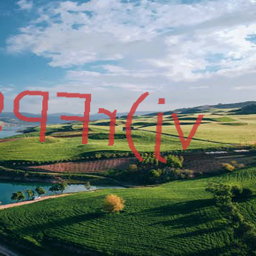

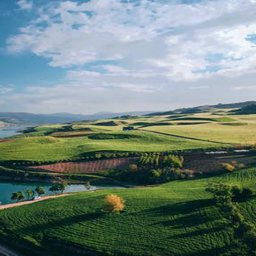

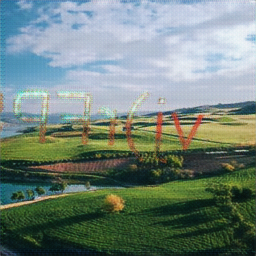

Epoch 28/100, Discriminator Loss: 0.3257084966402042, Generator Loss: 5.037314911173959


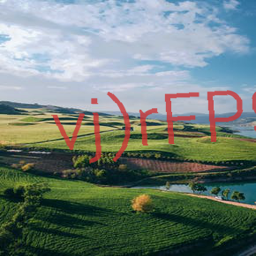

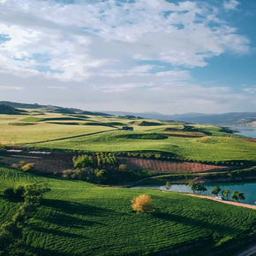

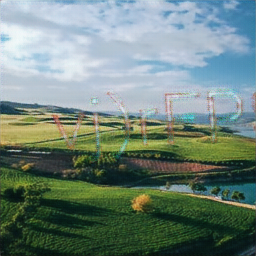

Epoch 29/100, Discriminator Loss: 0.3864399383870747, Generator Loss: 3.627445236230508


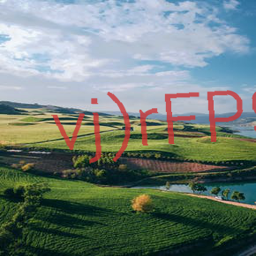

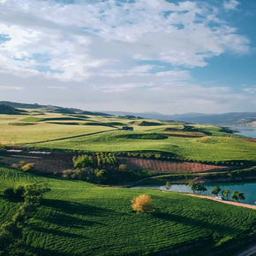

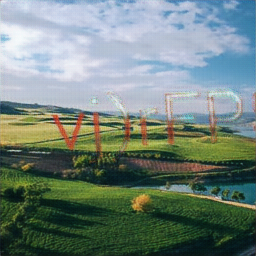

Epoch 30/100, Discriminator Loss: 0.21137613559132137, Generator Loss: 4.907337854051183


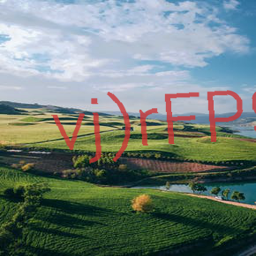

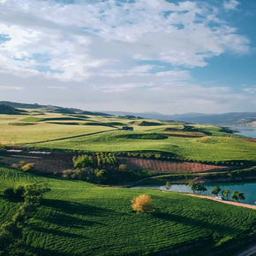

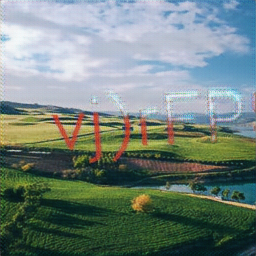

Epoch 31/100, Discriminator Loss: 0.20737411182733953, Generator Loss: 5.066410758216836


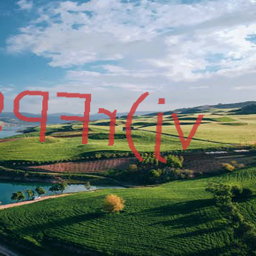

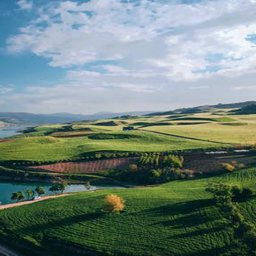

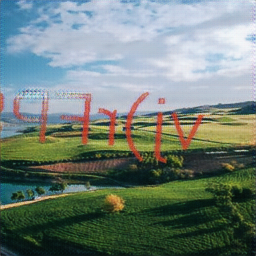

Epoch 32/100, Discriminator Loss: 0.1714448541130186, Generator Loss: 6.007778286594271


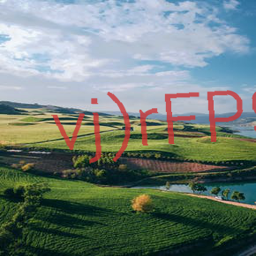

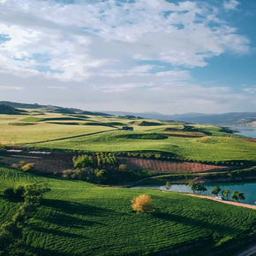

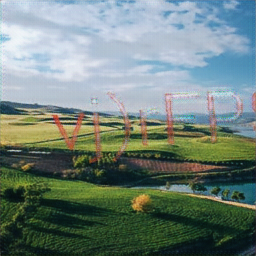

Epoch 33/100, Discriminator Loss: 0.35455034264201496, Generator Loss: 3.766563658700709


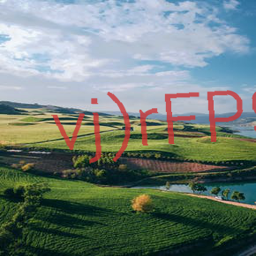

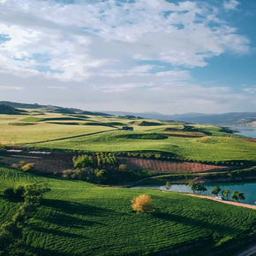

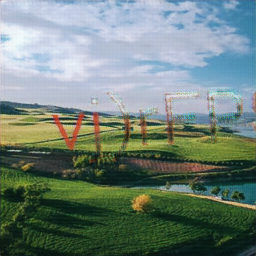

Epoch 34/100, Discriminator Loss: 0.1304406683799642, Generator Loss: 5.664513042849353


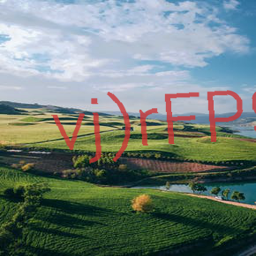

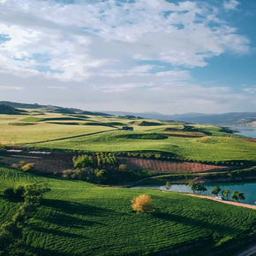

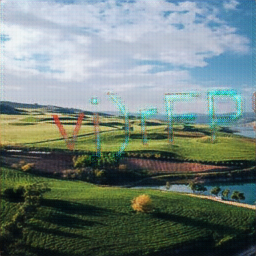

Epoch 35/100, Discriminator Loss: 0.16274131212514187, Generator Loss: 5.605323957242177


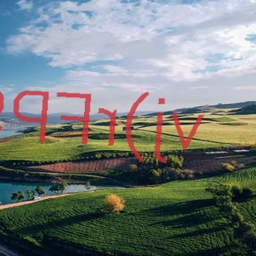

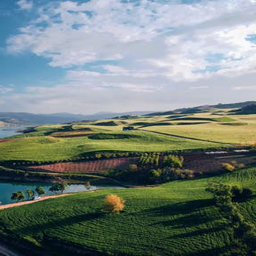

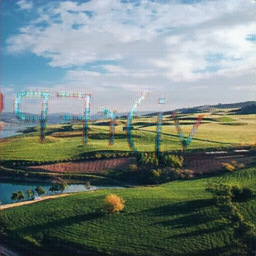

Epoch 36/100, Discriminator Loss: 0.05355815297787459, Generator Loss: 7.670311267898972


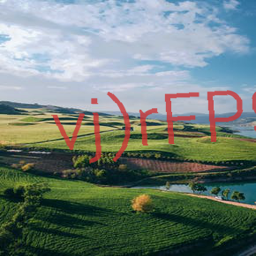

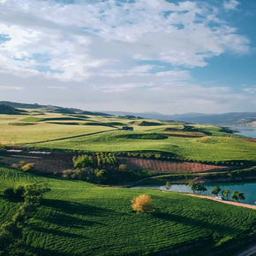

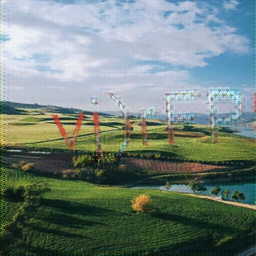

Epoch 37/100, Discriminator Loss: 0.1734609304077557, Generator Loss: 5.601454638348006


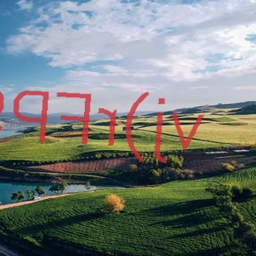

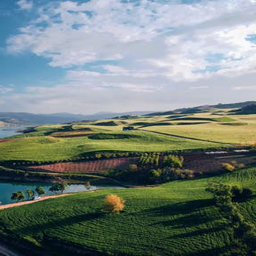

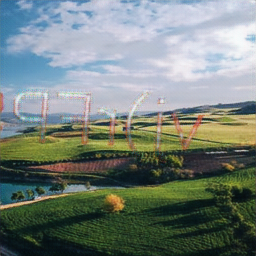

Epoch 38/100, Discriminator Loss: 0.08964941494620904, Generator Loss: 6.715218717556054


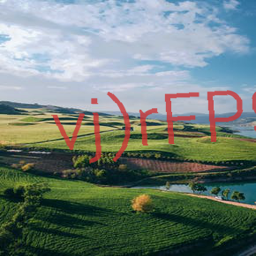

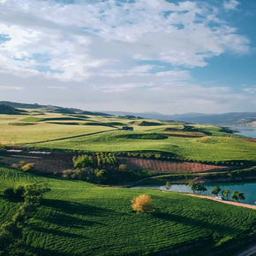

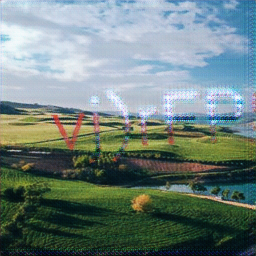

Epoch 39/100, Discriminator Loss: 0.26119991209048865, Generator Loss: 5.0654502128943415


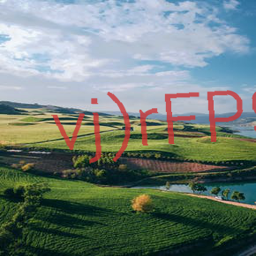

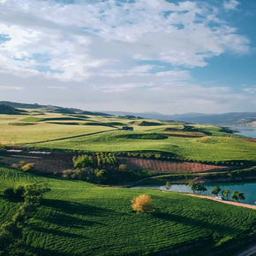

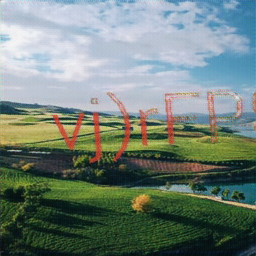

Epoch 40/100, Discriminator Loss: 0.11589248266286334, Generator Loss: 5.9121159430582635


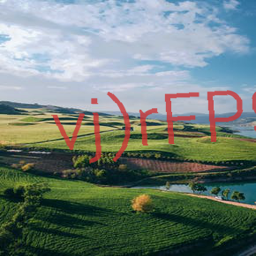

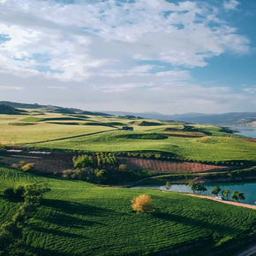

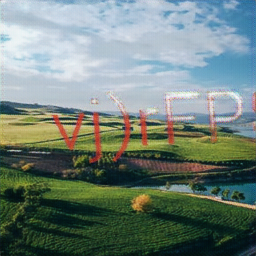

Epoch 41/100, Discriminator Loss: 0.17907209529200563, Generator Loss: 5.587113555340346


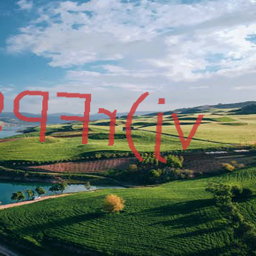

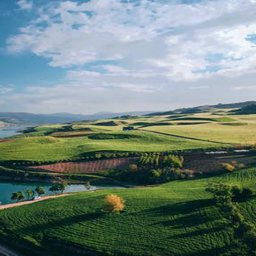

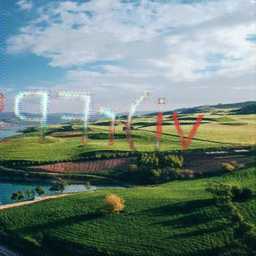

Epoch 42/100, Discriminator Loss: 0.11056988993480515, Generator Loss: 6.341384965809662


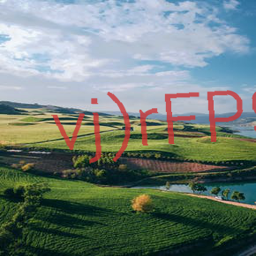

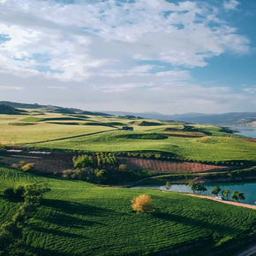

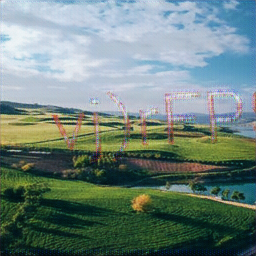

Epoch 43/100, Discriminator Loss: 0.280091464308726, Generator Loss: 4.737803862645076


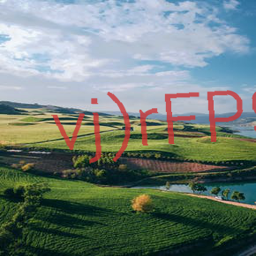

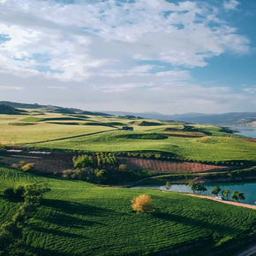

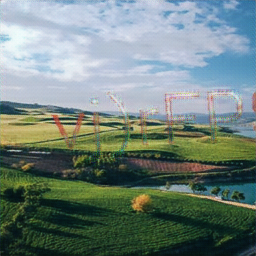

Epoch 44/100, Discriminator Loss: 0.09322571955885582, Generator Loss: 6.965133531820401


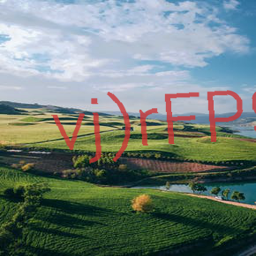

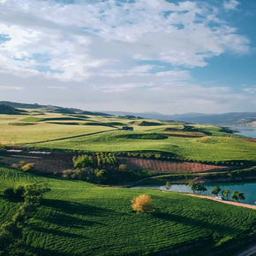

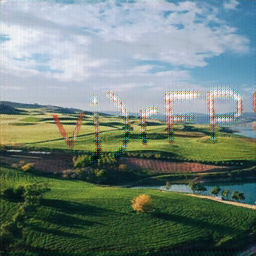

Epoch 45/100, Discriminator Loss: 0.24758760649272263, Generator Loss: 5.163206624848891


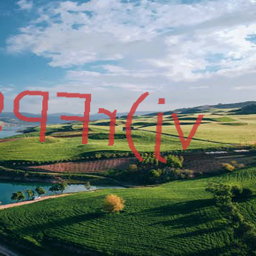

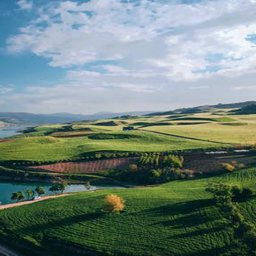

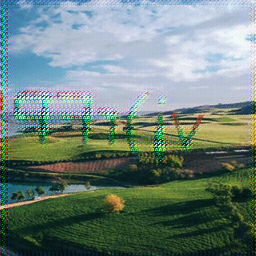

Epoch 46/100, Discriminator Loss: 0.13793013660517287, Generator Loss: 6.234769602786442


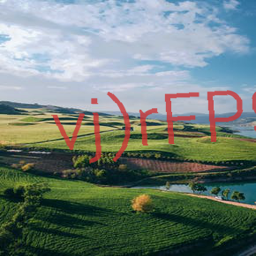

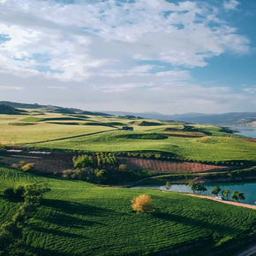

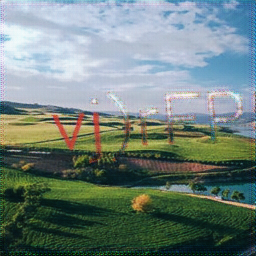

Epoch 47/100, Discriminator Loss: 0.09322669771593006, Generator Loss: 6.528486456286873


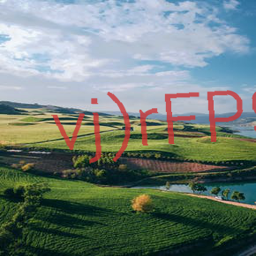

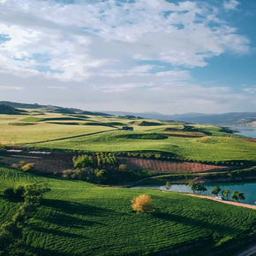

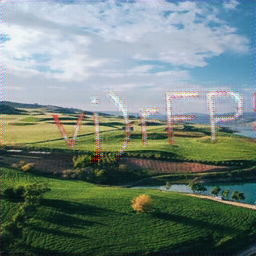

Epoch 48/100, Discriminator Loss: 0.0809503079165518, Generator Loss: 7.260938161798352


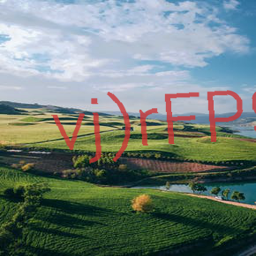

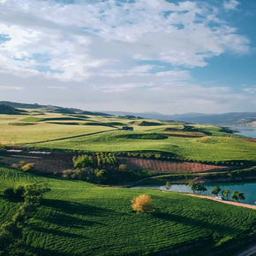

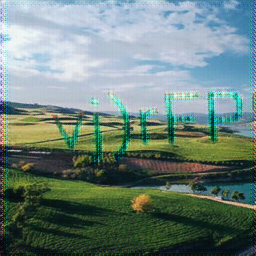

Epoch 49/100, Discriminator Loss: 0.1004160280174664, Generator Loss: 6.352435972276236


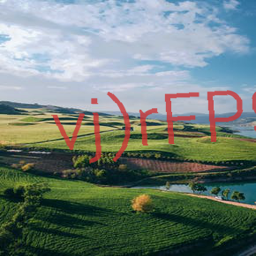

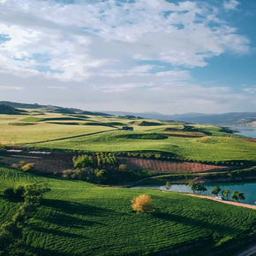

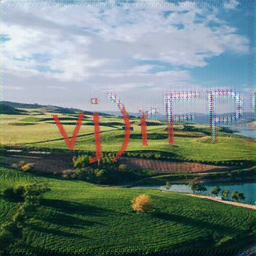

Epoch 50/100, Discriminator Loss: 0.06622197608020026, Generator Loss: 7.174763073948374


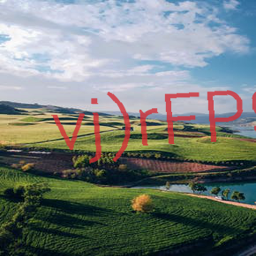

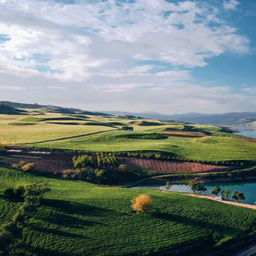

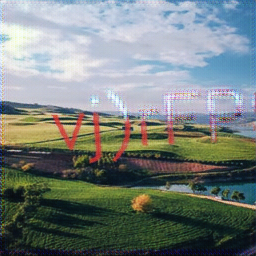

Epoch 51/100, Discriminator Loss: 0.006384781768151321, Generator Loss: 8.755413073080557


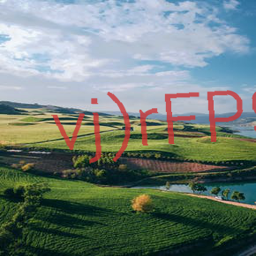

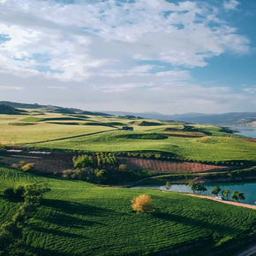

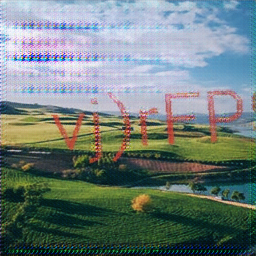

Epoch 52/100, Discriminator Loss: 0.46482325059546165, Generator Loss: 3.4041140307048785


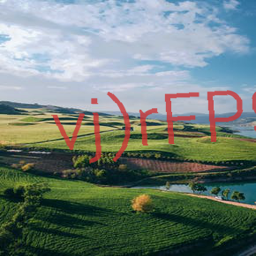

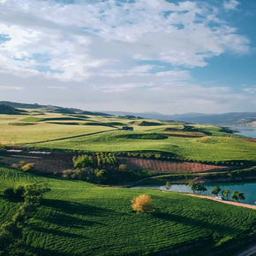

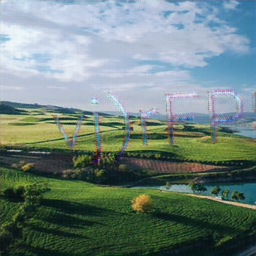

Epoch 53/100, Discriminator Loss: 0.08691142783330481, Generator Loss: 6.477705696709136


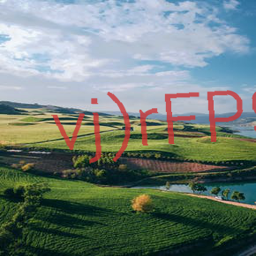

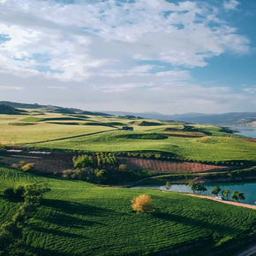

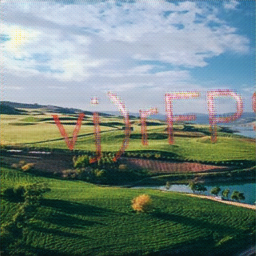

Epoch 54/100, Discriminator Loss: 0.11991392333430975, Generator Loss: 6.130427398233333


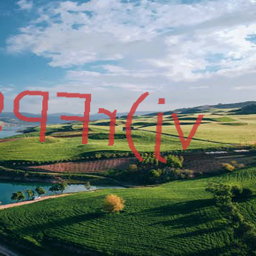

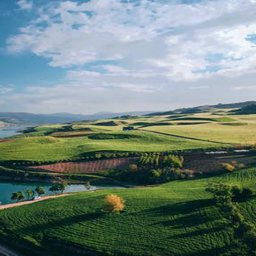

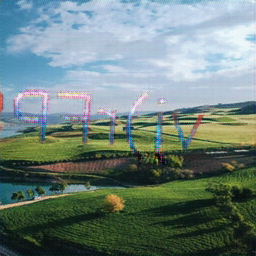

Epoch 55/100, Discriminator Loss: 0.04975602085317553, Generator Loss: 7.146255650751272


In [ ]:
#training loop for Pix2Pix

discriminator = Discriminator(6).to(device)
generator = UnetGenerator(3, 3, 64, norm_layer=nn.BatchNorm2d, use_dropout=True).to(device).float()

init_weights(generator, 'normal', scaling=0.02)
init_weights(discriminator, 'normal', scaling=0.02)
num_epochs = 50
D_optimizer = optim.Adam(discriminator.parameters(), lr=2.2e-4, betas=(0.5,0.999))
G_optimizer = optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5,0.999))
D_loss_plot, G_loss_plot = [], []
best_model = generator
best_model_FID = np.inf
trans = transforms.Compose([transforms.Normalize(mean = [0.,0.,0.], std =[1/0.5,1/0.5,1/0.5]), 
                                                                          transforms.Normalize(mean = [ -0.5, -0.5, -0.5 ], std = [1,1,1]),
                                                                          transforms.ToPILImage()])
for epoch in range(1, num_epochs+1): 
  

    D_loss_list, G_loss_list = [], []
    discriminator.train()
    generator.train()
   
    for (input_img, target_img) in train_dataloader:
       
        input_img = input_img.to(device)
        target_img = target_img.to(device)

        # ground truth labels real and fake
        real_target = Variable(torch.ones(input_img.size(0), 1, 30, 30).to(device))
        fake_target = Variable(torch.zeros(input_img.size(0), 1, 30, 30).to(device))
        
        for i in range(2): 
        
            # generator forward pass
            D_optimizer.zero_grad()
            generated_image = generator(input_img)

            # train discriminator with fake/generated images
            disc_inp_fake = torch.cat((input_img, generated_image), 1)
            D_fake = discriminator(disc_inp_fake.detach())
            D_fake_loss   =  discriminator_loss(D_fake, fake_target)

            # train discriminator with real images
            disc_inp_real = torch.cat((input_img, target_img), 1)                  
            D_real = discriminator(disc_inp_real)
            D_real_loss = discriminator_loss(D_real,  real_target)

            # average discriminator loss
            D_total_loss = (D_real_loss + D_fake_loss)/2 
            D_loss_list.append(D_total_loss.item())

            # compute gradients and run optimizer step
            D_total_loss.backward()
            D_optimizer.step()
        
        
        # Train generator with real labels
        G_optimizer.zero_grad()
        fake_gen = torch.cat((input_img, generated_image), 1)
        G = discriminator(fake_gen)
        G_loss = generator_loss(generated_image, target_img, G, real_target)                                 
        G_loss_list.append(G_loss.item())
        
        # compute gradients and run optimizer step
        G_loss.backward()
        G_optimizer.step()
        
    print(f'Epoch {epoch + 15}/100, Discriminator Loss: {sum(D_loss_list)/len(D_loss_list)}, Generator Loss: {sum(G_loss_list)/len(G_loss_list)}')
    # if epoch % 2 == 1:b
    input_image_list = []
    target_image_list = []
    generated_image_list = []
    with torch.no_grad():
        for (inputs, targets) in validation_dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            generator.eval()
            generated_images = generator(inputs)
            input_image_list = input_image_list + [trans(x).convert("RGB") for x in inputs]
            target_image_list = target_image_list + [trans(x).convert("RGB") for x in targets]
            generated_image_list = generated_image_list + [trans(x).convert("RGB") for x in generated_images]
    for ind, img in enumerate(target_image_list):
        img.save(f"./targets/{ind}.jpg")
    for ind, img in enumerate(generated_image_list):
        img.save(f"./generated/{ind}.jpg")
    FID_text = sp.getoutput('python -m pytorch_fid ./generated/ ./targets/')
    FID = float(FID_text.split()[-1])
    if FID < best_model_FID:
        best_model = generator
        print(f"Model Updated: FID {FID} < Last Best {best_model_FID}")
        best_model_FID = FID
        torch.save(best_model, "/content/drive/MyDrive/best_model2.pt")
        torch.save(discriminator, "/content/drive/MyDrive/best_discriminator2.pt")

    display(input_image_list[0])
    display(target_image_list[0])
    display(generated_image_list[0])
                    
torch.save(generator, '/content/drive/MyDrive/generator.pt')
torch.save(discriminator, '/content/drive/MyDrive/discriminator.pt')

# Image Generation for FID Comparison

In [24]:
#load the trained models
!cp /content/drive/MyDrive/Watermark\ Remover/scripts/autoencoders.py .
from autoencoders import *
pix2pix = torch.load('/content/drive/MyDrive/Watermark Remover/models/pix2pix_best.pt')
vae = torch.load('/content/drive/MyDrive/Watermark Remover/models/vae_aug.pt')
ae = torch.load('/content/drive/MyDrive/Watermark Remover/models/ae_aug.pt')

In [43]:
#now we generate and save images to the drive
trans = transforms.Compose([transforms.Normalize(mean = [0.,0.,0.], std =[1/0.5,1/0.5,1/0.5]), 
                                                                          transforms.Normalize(mean = [ -0.5, -0.5, -0.5 ], std = [1,1,1]),
                                                                          transforms.ToPILImage()])
trans_autoencoder_input = transforms.Compose([transforms.Normalize(mean = [0.,0.,0.], std =[1/0.5,1/0.5,1/0.5]), 
                                                                          transforms.Normalize(mean = [ -0.5, -0.5, -0.5 ], std = [1,1,1])])
autoencoder_trans = transforms.Compose([transforms.ToPILImage()])
input_image_list = []
target_image_list = []
pix2pix_image_list = []
vae_image_list = []
ae_image_list = []

with torch.no_grad():
    for (inputs, targets) in validation_dataloader:
        inputs = inputs.to(device)
        targets = targets.to(device)
        autoencoder_inputs = trans_autoencoder_input(TF.resize(inputs, 196))

        pix2pix.eval()
        vae.eval()
        ae.eval()

        pix2pix_images = pix2pix(inputs)
        vae_images, _, _ = vae(autoencoder_inputs)  
        ae_images = ae(autoencoder_inputs)

        vae_images = TF.resize(vae_images, 256)
        ae_images = TF.resize(ae_images, 256)

        input_image_list = input_image_list + [trans(x).convert("RGB") for x in inputs]
        target_image_list = target_image_list + [trans(x).convert("RGB") for x in targets]
        pix2pix_image_list = pix2pix_image_list + [trans(x).convert("RGB") for x in pix2pix_images]
        vae_image_list = vae_image_list + [autoencoder_trans(x) for x in vae_images]
        ae_image_list = ae_image_list + [autoencoder_trans(x) for x in ae_images]

#save the images to the appropriate folders        
for ind, img in enumerate(input_image_list):
    img.save(f"/content/drive/MyDrive/Watermark Remover/watermark_images/{ind}.jpg")
for ind, img in enumerate(target_image_list):
    img.save(f"/content/drive/MyDrive/Watermark Remover/nonwatermark_images/{ind}.jpg")
for ind, img in enumerate(pix2pix_image_list):
    img.save(f"/content/drive/MyDrive/Watermark Remover/pix2pix_images/{ind}.jpg")
for ind, img in enumerate(vae_image_list):
    img.save(f"/content/drive/MyDrive/Watermark Remover/vae_images/{ind}.jpg")
for ind, img in enumerate(ae_image_list):
    img.save(f"/content/drive/MyDrive/Watermark Remover/ae_images/{ind}.jpg")


In [39]:
#calculate FID scores (Pix2Pix)
!python -m pytorch_fid /content/drive/MyDrive/Watermark\ Remover/pix2pix_images/ /content/drive/MyDrive/Watermark\ Remover/nonwatermark_images/

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:00<00:00, 110MB/s]
100% 25/25 [00:04<00:00,  5.56it/s]
100% 25/25 [00:04<00:00,  5.62it/s]
FID:  19.239526622239453


In [44]:
#calculate FID scores (VAE)
!python -m pytorch_fid /content/drive/MyDrive/Watermark\ Remover/vae_images/ /content/drive/MyDrive/Watermark\ Remover/nonwatermark_images/

100% 25/25 [00:04<00:00,  5.24it/s]
100% 25/25 [00:04<00:00,  5.61it/s]
FID:  140.1116092317332


In [45]:
#calculate FID scores (AE)
!python -m pytorch_fid /content/drive/MyDrive/Watermark\ Remover/ae_images/ /content/drive/MyDrive/Watermark\ Remover/nonwatermark_images/

100% 25/25 [00:04<00:00,  5.72it/s]
100% 25/25 [00:03<00:00,  6.66it/s]
FID:  82.49145880545524
